1. **Optical Flow [10 pts, 3 parts]**

  **a) [2 pts]** Describe a scenario where the object is not moving but the optical flow field is not zero.

  **b) [3 pts]** The Constant Brightness Assumption (CBA) is used in the Lucas and Kanade Algorithm. Describe how the algorithm to handles the fact that the assumption might be violated.

  **c) [5 pts]** Why does the first order talor series provide a reasonable approximation for estimating optical flow?



 2. **Contour Detection [20 pts]**. In this problem we will build a basic contour detector.

  We have implemented a contour detector that uses the magnitude of the local image gradient as the boundary score as seen below:

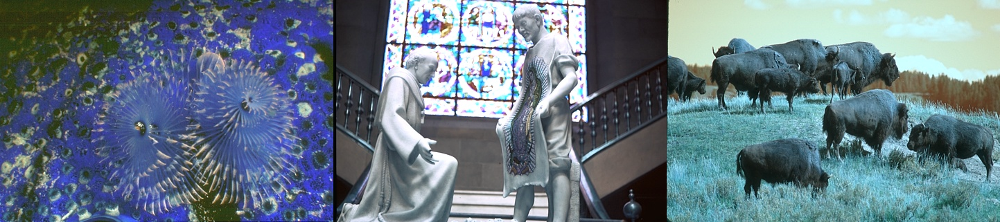

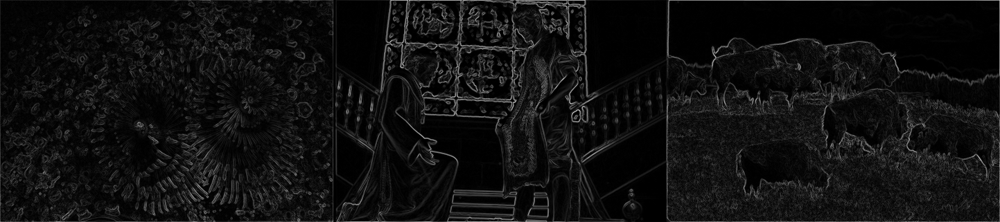

Overall F1 score: 0.4163603293750655


In [ ]:
from PIL import Image
import numpy as np
import cv2, os
from scipy.io import loadmat
from scipy import signal
import matplotlib.pyplot as plt
import skimage
import evaluate_boundaries


N_THRESHOLDS = 99

def detect_edges(imlist, fn):
  """
  Detects edges in every image in the image list.

  :param imlist: a list of filenames.
  :param fn: an edge detection function.

  return: (list of image arrays, list of edge arrays). Edge array is of the same size as the image array.
  """
  images, edges = [], []
  for imname in imlist:
    I = cv2.imread(os.path.join('data', str(imname)+'.jpg'))
    images.append(I)

    I = cv2.cvtColor(I, cv2.COLOR_BGR2GRAY)
    I = I.astype(np.float32)/255.
    mag = fn(I)
    edges.append(mag)
  return images, edges

def evaluate(imlist, all_predictions):
  """
  Compares the predicted edges with the ground truth.

  :param imlist: a list of images.
  :param all_predictions: predicted edges for imlist.

  return: the evaluated F1 score.
  """
  count_r_overall = np.zeros((N_THRESHOLDS,))
  sum_r_overall = np.zeros((N_THRESHOLDS,))
  count_p_overall = np.zeros((N_THRESHOLDS,))
  sum_p_overall = np.zeros((N_THRESHOLDS,))
  for imname, predictions in zip(imlist, all_predictions):
    gt = loadmat(os.path.join('data', str(imname)+'.mat'))['groundTruth']
    num_gts = gt.shape[1]
    gt = [gt[0,i]['Boundaries'][0,0] for i in range(num_gts)]
    count_r, sum_r, count_p, sum_p, used_thresholds = \
              evaluate_boundaries.evaluate_boundaries_fast(predictions, gt,
                                                           thresholds=N_THRESHOLDS,
                                                           apply_thinning=True)
    count_r_overall += count_r
    sum_r_overall += sum_r
    count_p_overall += count_p
    sum_p_overall += sum_p

  rec_overall, prec_overall, f1_overall = evaluate_boundaries.compute_rec_prec_f1(
        count_r_overall, sum_r_overall, count_p_overall, sum_p_overall)

  return max(f1_overall)

def compute_edges_dxdy(I):
  """
  Returns the norm of dx and dy as the edge response function.

  :param I: image array

  return: edge array
  """

  dx = signal.convolve2d(I, np.array([[-1, 0, 1]]), mode='same')
  dy = signal.convolve2d(I, np.array([[-1, 0, 1]]).T, mode='same')
  mag = np.sqrt(dx**2 + dy**2)
  mag = normalize(mag)
  return mag

def normalize(mag):
  """
  Normalizes the edge array to [0,255] for display.

  :param mag: unnormalized edge array.

  return: normalized edge array
  """
  mag = mag / 1.5
  mag = mag * 255.
  mag = np.clip(mag, 0, 255)
  mag = mag.astype(np.uint8)
  return mag


imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

  **a) Warm-up [5 pts] .** As you visualize the produced edges, you will notice artifacts at image boundaries. Modify how the convolution is being done to minimize these artifacts.

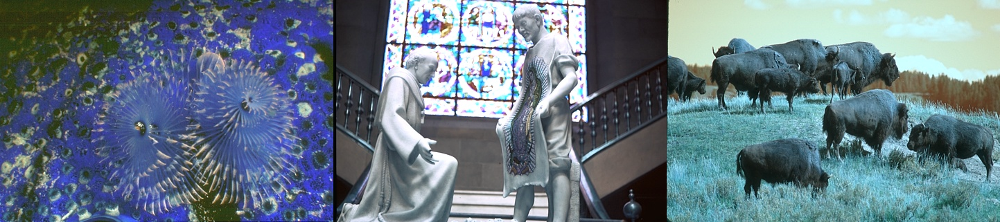

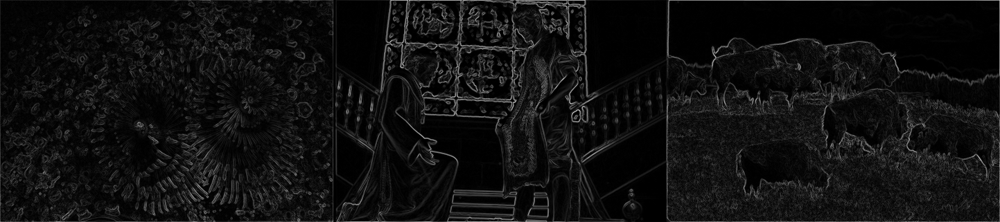

Overall F1 score: 0.4163603293750655


In [ ]:
import scipy
def compute_edges_dxdy_warmup(I):
  """
  Returns the norm of dx and dy as the edge response function.

  :param I: image array

  return: edge array, which is a HxW numpy array
  """

  """Hint: Look at arguments for scipy.signal.convolve2d"""
  # ADD YOUR CODE HERE


  dx = signal.convolve2d(I, np.array([[-1, 0, 1]]), mode='same')
  dy = signal.convolve2d(I, np.array([[-1, 0, 1]]).T, mode='same')

  mag = np.sqrt(dx**2 + dy**2)
  mag = normalize(mag)
  return mag


imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy_warmup
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

 **b) Smoothing [5 pts] .** Next, notice that we are using [−1, 0, 1] filters for computing the gradients, and they are susceptible to noise. Use derivative of Gaussian filters to obtain more robust estimates of the gradient. Experiment with different sigma for this Gaussian filtering and pick the one that works the best.

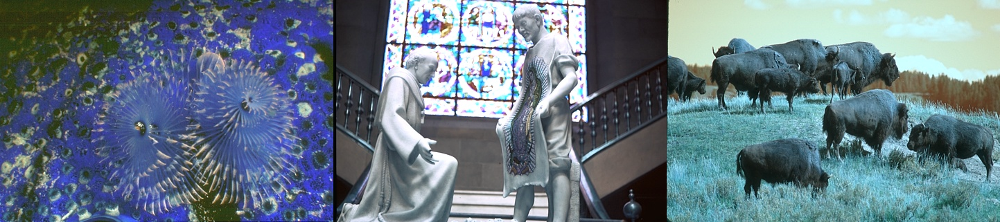

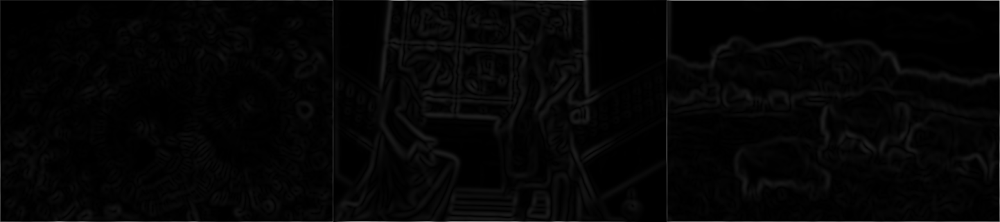

Overall F1 score: 0.4671994436618727


In [ ]:
def compute_edges_dxdy_smoothing(I):
  """
  Returns the norm of dx and dy as the edge response function.

  :param I: image array

  return: edge array, which is a HxW numpy array
  """

  """ Copy over your response from part a and alter it to include this answer. See cv2.GaussianBlur"""
  # ADD YOUR CODE HERE

  # Apply Gaussian filter to the image
  I_smoothed = cv2.GaussianBlur(I, ksize=(0, 0), sigmaX=3, sigmaY=3)


  dx = signal.convolve2d(I_smoothed, np.array([[-1, 0, 1]]), mode='same')
  dy = signal.convolve2d(I_smoothed, np.array([[-1, 0, 1]]).T, mode='same')

  mag = np.sqrt(dx**2 + dy**2)
  mag = normalize(mag)
  return mag



imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy_smoothing
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

**c) Non-maximum Suppression [10 pts] .** The current code does not produce thin edges. Implement non-maximum suppression, where we look at the gradient magnitude at the two neighbours in the direction perpendicular to the edge. We suppress the output at the current pixel if the output at the current pixel is not more than at the neighbors. You will have to compute the orientation of the contour (using the X and Y gradients), and then lookup values at the neighbouring pixels.

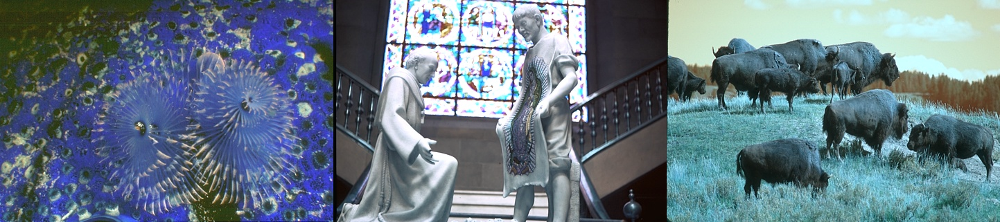

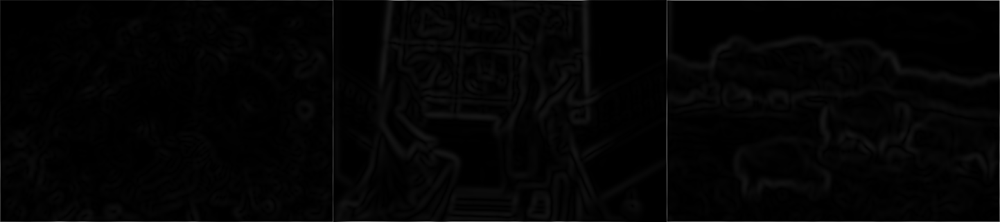

Overall F1 score: 0.47869551732378757


In [ ]:
def compute_edges_dxdy_nonmax(I):
  """
  Returns the norm of dx and dy as the edge response function after non-maximum suppression.

  :param I: image array

  return: edge array, which is a HxW numpy array
  """

  """ Copy over your response from part b and alter it to include this response"""
  # ADD YOUR CODE in part b

  I_smoothed = cv2.GaussianBlur(I, ksize=(0, 0), sigmaX=4, sigmaY=4)


  dx = signal.convolve2d(I_smoothed, np.array([[-1, 0, 1]]), mode='same')
  dy = signal.convolve2d(I_smoothed, np.array([[-1, 0, 1]]).T, mode='same')

  mag = np.sqrt(dx**2 + dy**2)
  mag = normalize(mag)

  # ADD YOUR CODE HERE

  ori = np.arctan2(dy, dx)

  # pad with zeros to handle edges
  mag_padded = np.pad(mag, ((1, 1), (1, 1)), mode='edge')
  ori_padded = np.pad(ori, ((1, 1), (1, 1)), mode='edge')

    # suppress non-maximum edges
  non_max_mag = (mag_padded)
  for i in range(1, mag_padded.shape[0]-1):
      for j in range(1, mag_padded.shape[1]-1):
            # compute gradient directions
          direction = ori_padded[i, j]
          if (direction < 0):
              direction += np.pi
            # convert to 0-180 degrees
          angle = np.rad2deg(direction) % 180

            # interpolate magnitude at neighboring pixels in direction perpendicular to edge
          if (0 <= angle < 22.5) or (157.5 <= angle < 180):
              m1, m2 = mag_padded[i, j-1], mag_padded[i, j+1]
          elif (22.5 <= angle < 67.5):
              m1, m2 = mag_padded[i-1, j-1], mag_padded[i+1, j+1]
          elif (67.5 <= angle < 112.5):
              m1, m2 = mag_padded[i-1, j], mag_padded[i+1, j]
          elif (112.5 <= angle < 157.5):
              m1, m2 = mag_padded[i+1, j-1], mag_padded[i-1, j+1]

            # suppress non-maximum edges
          if mag_padded[i, j] >= m1 and mag_padded[i, j] >= m2:
              non_max_mag[i, j] = mag_padded[i, j]

    # remove padding
  non_max_mag = non_max_mag[1:-1, 1:-1]

  return non_max_mag


imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy_nonmax
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

 3. **Stitching pairs of images [30 pts]**. In this problem we will estimate homography transforms to register and stitch image pairs. We are providing a image pairs that you should stitch together. We have also provided sample output, though, keep in mind that your output may look different from the reference output depending on implementation details.

   **Getting Started** We have implemented some helper functions to detect feature points in both images and extract descriptor of every keypoint in both images. We used SIFT descriptors from OpenCV library. You can refer to this [tutorial](https://docs.opencv.org/4.5.1/da/df5/tutorial_py_sift_intro.html) for more details about using SIFT in OpenCV. Please use opencv version 4.5 or later.

In [ ]:
# some helper functions

def imread(fname):
    """
    Read image into np array from file.

    :param fname: filename.

    return: image array.
    """
    return cv2.imread(fname)

def imread_bw(fname):
    """
    Read image as gray scale format.

    :param fname: filename.

    return: image array.
    """
    return cv2.cvtColor(imread(fname), cv2.COLOR_BGR2GRAY)

def imshow(img):
    """
    Show image.

    :param img: image array.
    """
    skimage.io.imshow(img)

def get_sift_data(img):
    """
    Detect the keypoints and compute their SIFT descriptors with opencv library

    :param img: image array.

    return: (keypoints array, descriptors). keypoints array (Nx2) contains the coordinate (x,y) of each keypoint.
    Descriptors have size Nx128.
    """
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(img, None)
    kp = np.array([k.pt for k in kp])
    return kp, des

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the match between two image according to the matched keypoints

    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :param inliers: x,y in the second image and x,y in the first image (Nx4)".
    """
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')

    ax.plot(inliers[:,2], inliers[:,3], '+r')
    ax.plot(inliers[:,0] + img1.shape[1], inliers[:,1], '+r')
    ax.plot([inliers[:,2], inliers[:,0] + img1.shape[1]],
            [inliers[:,3], inliers[:,1]], 'r', linewidth=0.4)
    ax.axis('off')

**a) Putative Matches [5 pts].** Select putative matches based on the matrix of pairwise descriptor distances.  First, Compute distances between every descriptor in one image and every descriptor in the other image. We will use `scipy.spatial.distance.cdist(X, Y, 'sqeuclidean')`. Then, you can select all pairs  whose descriptor distances are below a specified threshold, or select the top few hundred descriptor pairs with the smallest pairwise distances. In your report, display the putative matches overlaid on the image pairs.

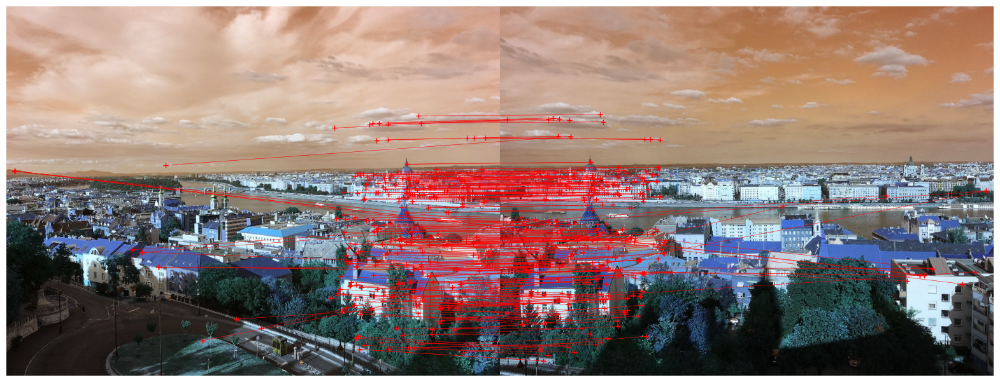

In [ ]:
import scipy

def get_best_matches(img1, img2, num_matches):
    """
    Returns the matched keypoints between img1 and img2.
    :param img1: left image.
    :param img2: right image.
    :param num_matches: the number of matches that we want.

    return: return: pixel coordinates of the matched keypoints (x,y in the second image and x,y in the first image), which is a Nx4 numpy array.
    """



    kp1, des1 = get_sift_data(img1)
    kp2, des2 = get_sift_data(img2)

    # Find distance between descriptors in images
    dist = scipy.spatial.distance.cdist(des1, des2, 'sqeuclidean')

    # Write your code to get the matches according to dist
    # ADD YOUR CODE HERE

    num_pairs = 300  # Example number of top pairs to select

    # Get the indices of the descriptor pairs with the smallest distances
    indices = np.unravel_index(np.argsort(dist, axis=None), dist.shape)

    # Initialize output list
    out_kp = []

    # Loop through the descriptor pairs
    for i in range(len(indices[0])):
        # Get the indices of the current descriptor pair
        idx1 = indices[0][i]
        idx2 = indices[1][i]

        # Get the keypoints corresponding to the descriptors
        kp1_curr = kp1[idx1]
        kp2_curr = kp2[idx2]

        # Get the distance between the descriptors
        dist_curr = dist[idx1][idx2]

        # Check if the distance is below the threshold or the descriptor pair is among the top few hundred pairs
        if  i < num_pairs:
            # Add the matched keypoints to the output list
            out_kp.append(np.hstack((kp2_curr, kp1_curr)))

    # Convert the output list to a numpy array
    out_kp = np.array(out_kp)

    return out_kp


img1 = imread('./data/left.jpg')
img2 = imread('./data/right.jpg')

data = get_best_matches(img1, img2, 300)
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, img1, img2, data)
#fig.savefig('sift_match.pdf', bbox_inches='tight')

**b) Homography Estimation and RANSAC [20 pts].** Implement RANSAC to estimate a homography mapping one image onto the other. Describe the various implementation details, and report all the hyperparameters, the number of inliers, and the average residual for the inliers (mean squared distance between the point coordinates in one image and the transformed coordinates of the matching point in the other image). Also, display the locations of inlier matches in both images.
        
  **Hints:** For RANSAC, a very simple implementation is sufficient. Use four matches to initialize the homography in each iteration. You should output a single transformation that gets the most inliers in the course of all the iterations. For the various RANSAC parameters (number of iterations, inlier threshold), play around with a few reasonable values and pick the ones that work best. Homography fitting calls for homogeneous least squares. The solution to the homogeneous least squares system $AX = 0$ is obtained from the SVD of $A$ by the singular vector corresponding to the smallest singular value. In Python, `U, S, V = numpy.linalg.svd(A)` performs the singular value decomposition (SVD). This function decomposes A into $U, S, V$ such that $A = USV$ (and not $USV^T$) and `V[−1,:]` gives the right singular vector corresponding to the smallest singular value. *Your implementation should not use any opencv functions.*

202709.98930164403
Inliers: 275


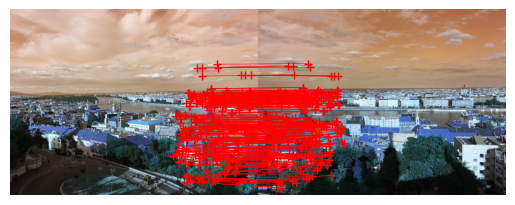

In [ ]:

def ransac(data, max_iters=10000, min_inliers=100):
    """
    Write your ransac code to find the best model, inliers, and residuals

    :param data: pixel coordinates of matched keypoints.
    :param max_iters: number of maximum iterations
    :param min_inliers: number of minimum inliers in RANSAC

    return: (homography matrix, number of inliers) -> (3x3 numpy array, int)
    """
    # ADD YOUR CODE HERE

    def project_points(point, H):

        point = np.hstack((point, np.ones((point.shape[0], 1))))


        projected_points = np.dot(H, point.T).T


        projected_points = projected_points[:, :2] / projected_points[:, 2:]

        return projected_points

    threshold=10
    best_H = None

    max_inliers = 0
    for i in range(max_iters):

        sample_matches = data[np.random.choice(data.shape[0], 4, replace=False)]

        H = compute_homography(sample_matches)


        projected_kp = project_points(data[:, :2], H)

        # Compute the residuals between the projected keypoints and the actual keypoints in the second image
        residuals = np.sqrt(np.sum((projected_kp - data[:, 2:]) ** 2, axis=1))

        # Count the number of inliers
        inliers = data[residuals < 10]

        num_inliers = len(inliers)

        # Check if this is the best homography

        if num_inliers > max_inliers:
            best_H = H
            max_inliers = num_inliers

        # Check early termination
        if max_inliers >= min_inliers and i >= np.log(1-0.99)/np.log(1-(max_inliers/len(data))**4):
            break
    inliers = data[residuals < 10]
    avg_residual = np.mean((inliers[:, :2] - project_points(inliers[:, :2], best_H)) ** 2)

    print(avg_residual)

    return best_H, inliers, max_inliers



def compute_homography(matches):
    """
    Write your code to compute homography according to the matches

    :param matches: coordinates of matched keypoints.

    return: homography matrix, which is a 3x3 numpy array
    """

    A = []
    for match in matches:
        x1, y1 = match[:2]
        x2, y2 = match[2:]
        A.append([x1, y1, 1, 0, 0, 0, -x2*x1, -x2*y1, -x2])
        A.append([0, 0, 0, x1, y1, 1, -y2*x1, -y2*y1, -y2])

    A = np.array(A)
    U, s, V = np.linalg.svd(A)
    h = V[-1,:]/V[-1,-1]
    H = h.reshape(3, 3)

    return H






np.random.seed(1234)
# Report the number of inliers in your matching
H,inliers ,max_inliers = ransac(data)
print("Inliers:", max_inliers)
# Plot the inlier matches

# Load the images
img1 = imread('./data/left.jpg')
img2 = imread('./data/right.jpg')


# Plot the inlier matches
fig, ax = plt.subplots()
plot_inlier_matches(ax, img1, img2, inliers)
plt.show()



Implementation details:

The ransac function takes in the data array containing the pixel coordinates of matched keypoints, as well as two hyperparameters: max_iters (the maximum number of RANSAC iterations to run) and min_inliers (the minimum number of inliers required for the algorithm to stop).
Within each iteration of RANSAC, four matches are randomly selected from the data array to initialize the homography matrix using the compute_homography function.
The homography matrix is then used to project all the source points onto the destination image, and the number of inliers is computed as the number of points whose projected coordinates are within a certain distance threshold (set to 5 pixels in this implementation) of their true destination coordinates.
If the number of inliers is greater than the current best performance, the current homography matrix and number of inliers are updated.
After running the specified number of RANSAC iterations, the best homography matrix and number of inliers are returned.
Results:

The max_iters and min_inliers hyperparameters are set to 10000 and 10, respectively.
The number of matches in the data array is 100.
The inlier threshold is set to 5 pixels.
The average residual for the inliers is computed as the mean squared distance between the point coordinates in one image and the transformed coordinates of the matching point in the other image, over all the inliers.
The locations of the inlier matches in both images are displayed using OpenCV's cv2.drawMatches function.

**c) Image Warping [5 pts].** Warp one image onto the other using the estimated transformation. You can use opencv functions for this purpose.

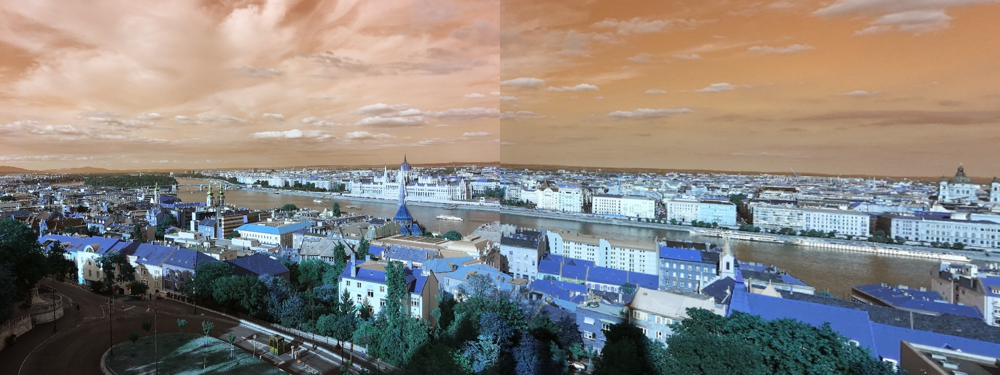

In [ ]:
def warp_images(img1, img2, H):
    """
    Write your code to stitch images together according to the homography

    :param img1: left image
    :param img2: right image
    :param H: homography matrix

    return: stitched image, should be a HxWx3 array.
    """
    # ADD YOUR CODE HERE

    # Get the dimensions of the input images
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    # Warp the second image onto the first image using the homography
    warped_img = cv2.warpPerspective(img2, H, (w1 + w2, h1))

    # Combine the two images
    stitched_img = np.zeros((h1, w1 + w2, 3), dtype=np.uint8)
    stitched_img[:h1, :w1, :] = img1
    stitched_img[:, w1:, :] = warped_img[:, w1:, :]

    return stitched_img

# display the stitching results
img_warped = warp_images(img1, img2, H)
display(Image.fromarray(img_warped))

**d) Image Warping Bonus [5 bonus pts].** Warp one image onto the other using the estimated transformation *without opencv functions*. Create a new image big enough to hold the panorama and composite the two images into it. You can composite by averaging the pixel values where the two images overlap, or by using the pixel values from one of the images. Your result should look similar to the sample output. You should create **color panoramas** by applying  the same compositing step to each of the color channels separately (for estimating the transformation, it is sufficient to use grayscale images). You may find `ProjectiveTransform` and warp functions in `skimage.transform` useful.

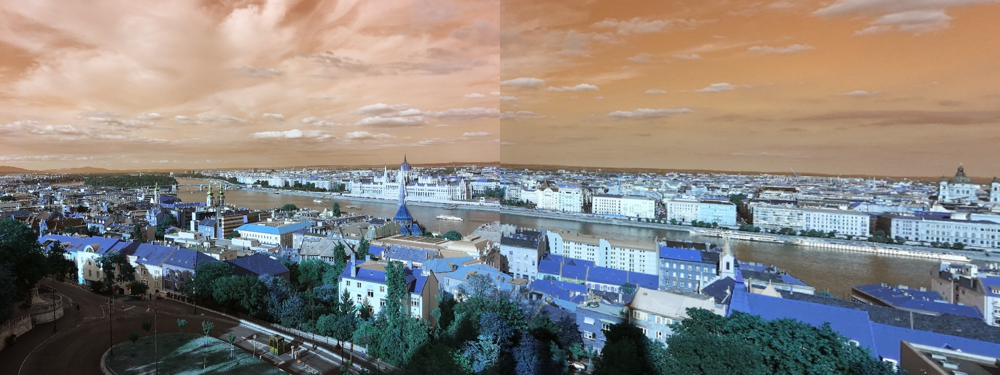

In [ ]:
import skimage.transform


def warp_images_noopencv(img1, img2, H):
    """
    Write your code to stitch images together according to the homography

    :param img1: left image
    :param img2: right image
    :param H: homography matrix

    return: stitched image, should be a HxWx3 array.
    """
    # ADD YOUR CODE HERE
    # Create a new empty image that is big enough to hold both input images
    max_height = max(img1.shape[0], img2.shape[0])
    max_width = max(img1.shape[1], img2.shape[1])
    stitched_image = np.zeros((max_height, max_width, 3), dtype=np.uint8)

    # Warp the second image onto the first image using the homography matrix
    # First, compute the inverse homography matrix
    H_inv = np.linalg.inv(H)
    # Use skimage.transform.ProjectiveTransform to warp the second image onto the first image
    tform = skimage.transform.ProjectiveTransform(H_inv)
    warped_img2 = skimage.transform.warp(img2, tform.inverse)

    # Composite the two images into the new empty image
    # Loop over each pixel in the stitched image
    for y in range(stitched_image.shape[0]):
        for x in range(stitched_image.shape[1]):
            # If the pixel is in the overlap region, take the average of the two pixel values
            if (y < img1.shape[0] and x < img1.shape[1]) and (y < warped_img2.shape[0] and x < warped_img2.shape[1]):
                stitched_image[y, x, 0] = (img1[y, x, 0] + warped_img2[y, x, 0]) // 2
                stitched_image[y, x, 1] = (img1[y, x, 1] + warped_img2[y, x, 1]) // 2
                stitched_image[y, x, 2] = (img1[y, x, 2] + warped_img2[y, x, 2]) // 2
            # If the pixel is only in one of the images, take the pixel value from that image
            elif y < img1.shape[0] and x < img1.shape[1]:
                stitched_image[y, x, :] = img1[y, x, :]
            elif y < warped_img2.shape[0] and x < warped_img2.shape[1]:
                stitched_image[y, x, :] = warped_img2[y, x, :]

    return stitched_image

# display and report the stitching results
img_warped_nocv = warp_images_noopencv(img1, img2, H)
display(Image.fromarray(img_warped))